# 5. Counting Objects in Each Direction


Import Libraries:


In [76]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Polygon

Reading data:


In [79]:
#raw_data filtered based in object type and racking status
data_cleaned = pd.read_csv('data/1_data_cleaned.csv')

# creating spatial data from dataFrame
points_gdf = gpd.GeoDataFrame(data_cleaned, geometry=gpd.points_from_xy(data_cleaned['lon'], data_cleaned['lat']), crs=4326)

# lines - routes of each object with calculated statistics
lines_gdf_stat = gpd.read_file('data/2_lines_gdf_stat.gpkg')

# filtering lines based in object type
lines_gdf_cars = lines_gdf_stat[lines_gdf_stat['object_type'] =='CAR']
lines_gdf_pedestrians = lines_gdf_stat[lines_gdf_stat['object_type'] =='PEDESTRIAN']
lines_gdf_two_wheelers = lines_gdf_stat[lines_gdf_stat['object_type'] =='CYCLIST']

Additional function used:


This function creates a rectangular grid based on another GeoDataFrame (to calculate the extent) and the square size.


In [80]:
def create_regular_grid(gdf, square_size):

    #calculating UTM zone for the data
    utm_zone = gdf.estimate_utm_crs()
    #reproject data
    gdf = gdf.to_crs(utm_zone)
    minX, minY, maxX, maxY = gdf.total_bounds
    
    grid_cells = []
    x, y = minX, minY

    while y <= maxY:
        while x <= maxX:
            geom = Polygon([(x, y), (x, y + square_size), (x + square_size, y + square_size), (x + square_size, y), (x, y)])
            grid_cells.append(geom)
            x += square_size
        x = minX
        y += square_size

    fishnet = gpd.GeoDataFrame(geometry=grid_cells, crs=utm_zone)
    fishnet['grid_id'] = range(len(grid_cells))
    fishnet = fishnet.to_crs(epsg=4326)
    return fishnet

Function to find clusters of polygons based on spatial relationships (touches or intersects):


In [ ]:
def find_polygon_clusters(gdf):
    # Ensure geometries are valid
    gdf = gdf[gdf.is_valid]
    
    # Initialize a dictionary to store cluster names
    cluster_names = {}
    
    # Initialize an empty list to store groups of neighboring polygons
    polygon_groups = []
    
    # Counter for cluster names
    cluster_counter = 1
    
    # Loop through each polygon and find its neighbors
    for idx, polygon in gdf.iterrows():
        if idx not in cluster_names:
            cluster_names[idx] = f'Cluster{cluster_counter}'
            cluster_counter += 1
        
        # Find neighboring polygons (e.g., polygons that touch or intersect)
        neighbors = gdf[gdf.geometry.touches(polygon['geometry']) | gdf.geometry.intersects(polygon['geometry'])]
        
        # Check if the polygon and its neighbors form a MultiPolygon
        if len(neighbors) > 0:
            merged_geometry = MultiPolygon([polygon['geometry']] + list(neighbors['geometry']))
            polygon_groups.append(merged_geometry)
            
            # Assign the same cluster name to all neighbors
            for neighbor_idx in neighbors.index:
                if neighbor_idx not in cluster_names:
                    cluster_names[neighbor_idx] = cluster_names[idx]
    
    # Assign cluster names to the GeoDataFrame
    gdf['cluster'] = gdf.index.map(cluster_names)
    
    return gdf


## Defining directions and calculating number of cars in each direction. Option 1


This approach aims to detect areas where objects usually start being tracked and where they end. Based on these areas, we can see from which area to which objects move and calculate their amount.


#### Creating Starting points


In [32]:
starting_points = points_gdf.groupby('object_id').first().reset_index().set_crs(epsg=4326)
starting_points.head()

,object_id,Unnamed: 0,timestamp,heading,height,width,length,v,tracking_status,object_type,lon,lat,geometry
0,152997118,0,1712062811083,132.072,0.735,1.942,4.387,0.03,TRACKING,CAR,13.064405,47.810136,POINT (13.06440 47.81014)
1,152997181,2802,1712062820184,198.052,1.458,0.641,0.366,1.10,TRACKING,PEDESTRIAN,13.063991,47.810058,POINT (13.06399 47.81006)
2,152997182,4156,1712062820083,319.543,1.690,1.916,4.555,0.02,TRACKING,CAR,13.064130,47.810046,POINT (13.06413 47.81005)
3,152997183,6803,1712062822387,103.052,0.539,1.923,4.550,1.92,TRACKING,CAR,13.063387,47.809774,POINT (13.06339 47.80977)
4,152997184,7812,1712062824786,85.395,1.207,1.981,4.367,2.18,TRACKING,CAR,13.063389,47.809776,POINT (13.06339 47.80978)


In [33]:
starting_points.explore(tiles='Esri.WorldImagery')

In [34]:
ending_points = points_gdf.groupby('object_id').last().reset_index().set_crs(epsg=4326)
ending_points.head()

,object_id,Unnamed: 0,timestamp,heading,height,width,length,v,tracking_status,object_type,lon,lat,geometry
0,152997118,2780,1712063097385,313.127,0.348,1.955,4.500,0.04,TRACKING,CAR,13.064403,47.810137,POINT (13.06440 47.81014)
1,152997181,4145,1712062958884,133.052,0.528,0.645,0.209,0.75,TRACKING,PEDESTRIAN,13.064302,47.809506,POINT (13.06430 47.80951)
2,152997182,6780,1712063090784,139.865,0.119,1.883,4.461,0.03,TRACKING,CAR,13.064130,47.810045,POINT (13.06413 47.81005)
3,152997183,7790,1712062924186,23.052,0.017,1.880,4.287,10.95,TRACKING,CAR,13.064855,47.810200,POINT (13.06485 47.81020)
4,152997184,8793,1712062925683,33.052,0.596,1.959,4.330,8.31,TRACKING,CAR,13.064773,47.810138,POINT (13.06477 47.81014)


In [9]:
ending_points.explore(tiles='Esri.WorldImagery')

#### CARS Directions


Creating grid to cover the extexnt for all starting and endinh points of car objects


In [11]:
startingPointsCars = starting_points[starting_points['object_type']=="CAR"]
endingPointsCars = ending_points[ending_points['object_type']=="CAR"]

startEndPointsCars = pd.concat([startingPointsCars, endingPointsCars], ignore_index=True)
grid = create_regular_grid(startEndPointsCars, 7.5)
grid.explore(tiles='Esri.WorldImagery')

Calculating the amount of starting points in each grid cell


In [81]:
points_grid = gpd.sjoin(startEndPointsCars, grid, predicate='within')
points_count = points_grid.groupby('grid_id').size().reset_index(name='points_count')
grid_with_count = grid.merge(points_count, on='grid_id', how='left')

grid_with_count.head()

grid_main_clusters = grid_with_count[grid_with_count['points_count']>25]
grid_with_count.explore(column='points_count', tiles='Esri.WorldImagery')

Defining clusters to detect specific areas where objects started being tracked:


In [83]:
cars_clusters = find_polygon_clusters(grid_main_clusters)
cars_clusters .explore(column='cluster', tiles='Esri.WorldImagery')

Assigning each starting and ending point to the clusters:


In [17]:
startingPointsCars_CLUSTER = gpd.sjoin(startingPointsCars.to_crs(cars_clusters .crs), cars_clusters , predicate='within')
endingPointsCars_CLUSTER = gpd.sjoin(endingPointsCars.to_crs(cars_clusters .crs), cars_clusters , predicate='within')

startingPointsCars_CLUSTER['start_cluster'] = startingPointsCars_CLUSTER['cluster']
endingPointsCars_CLUSTER['end_cluster'] = endingPointsCars_CLUSTER['cluster']

In [18]:
startingPointsCars_CLUSTER.explore(column="cluster",tiles='Esri.WorldImagery')

In [19]:
endingPointsCars_CLUSTER.explore(column="cluster", tiles='Esri.WorldImagery')

Calculating the amount of object in each direction based on clusters:


In [88]:
lines_gdf_cars = lines_gdf_cars.merge(startingPointsCars_CLUSTER[['object_id','start_cluster']], on="object_id", how="left")
lines_gdf_cars = lines_gdf_cars.merge(endingPointsCars_CLUSTER[['object_id','end_cluster']], on="object_id", how="left")
lines_gdf_cars.groupby(['start_cluster', 'end_cluster']).size()

start_cluster  end_cluster
Cluster1       Cluster1        36
               Cluster2         2
               Cluster3        14
               Cluster4       140
Cluster2       Cluster1       118
               Cluster2        66
               Cluster3       383
               Cluster4       114
Cluster3       Cluster1        31
               Cluster2       490
               Cluster3       298
               Cluster4       260
Cluster4       Cluster1       118
               Cluster2       249
               Cluster3       248
               Cluster4       922
Cluster5       Cluster5        18
dtype: int64

In [94]:
na_count = lines_gdf_cars[lines_gdf_cars['start_cluster'].isna() | lines_gdf_cars['end_cluster'].isna()].shape[0]

print("Objects that were not classified: %i" % (na_count))
print("Total amount of cars: %i" % (lines_gdf_cars.shape[0]))


Objects that were not classified: 671
Total amount of cars: 4178


This approach helps us calculate the number of objects moving in different directions based on the defined areas for start and end.

On the one hand, it is quite precise; on the other hand, there are some limitations that we have to acknowledge:

1. We lost around 16% of objects (671) for which the starting or ending points are not located in any of the clusters. Some of these objects could be standing, but definitely not all of them.

2. This approach is quite hard to implement as it is not clear how to detect clusters in the right way.

3. It works for cars but doesn't work for pedestrians and two-wheelers because it is even more challenging to detect specific starting and ending areas due to their more chaotic movement.

We would like to suggest to more approaches for this task below.


## Defining directions and calculating number of cars in each direction. Option 2


The previous approach unfortunately can't be applied to pedestrians and two-wheelers, as their routes are less clearly distinguishable and not straight. Therefore, for pedestrians and two-wheelers, we will define their directions based on the intersections with crosslines created by us in QGIS


#### CARS Directions


Reading data with manually created lines from QGIS


In [72]:
cars_crossing = gpd.read_file('data/add_intersections_cars.gpkg')
cars_crossing

,ID,geometry
0,SouthEast-North,"LINESTRING (13.06445 47.80972, 13.06435 47.80962)"
1,SouthEast-South,"LINESTRING (13.06434 47.80960, 13.06425 47.80953)"
2,North-West,"LINESTRING (13.06409 47.80996, 13.06413 47.80987)"
3,NorthWest-South,"LINESTRING (13.06398 47.80963, 13.06407 47.80975)"
4,NorthWest-North,"LINESTRING (13.06413 47.80982, 13.06408 47.80976)"
5,NorthEast-South,"LINESTRING (13.06421 47.80985, 13.06431 47.80980)"
6,NorthEast-North,"LINESTRING (13.06440 47.80976, 13.06431 47.80980)"
7,SouthWest-North,"LINESTRING (13.06421 47.80952, 13.06412 47.80956)"
8,SouthWest-South,"LINESTRING (13.06400 47.80960, 13.06410 47.80956)"


In [73]:
cars_crossing.explore(tiles='Esri.WorldImagery', column='ID')

Calculating the amount of intersections for each line:


In [74]:
# Perform a spatial join to find intersections
intersections = gpd.sjoin(cars_crossing, lines_gdf_cars, op='intersects')

# Count the number of intersections for each line
intersection_counts = intersections.groupby('ID').size().reset_index(name='intersection_count')

# Merge intersection counts with cars_crossing based on ID
cars_crossing = cars_crossing.merge(intersection_counts, on='ID', how='left')


cars_crossing.explore(tiles='Esri.WorldImagery', column='intersection_count',cmap='BuPu')


/Users/belka/Library/Python/3.10/lib/python/site-packages/IPython/core/interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [96]:
print("The amount of intersections: %i" % cars_crossing['intersection_count'].sum())
print("Total amount of cars: %i" % (lines_gdf_cars.shape[0]))

The amount of intersections: 4261
Total amount of cars: 4178


This approach seems to be much more precise, but there are still some limitations that we have to consider:

1. The number of intersections is slightly higher than amount of cars, which is acceptable; however, we expect many more due to multiple intersections along the route.

2. We need to manually draw the intersection lines, which may not be very accurate.

3. We are not sure how precise the data is, so there is a possibility that there are errors in the border calculations, making the intersection calculations less accurate.


#### PEDESTRIANS Directions


Reading data with manually created lines from QGIS


In [46]:
pedestrians_crossing = gpd.read_file('data/add_intersection_pedestrians.gpkg')
pedestrians_crossing

,ID,geometry
0,SouthEast,"LINESTRING (13.06419 47.80968, 13.06440 47.80959)"
1,SouthWest,"LINESTRING (13.06418 47.80967, 13.06403 47.80947)"
2,NorthWest,"LINESTRING (13.06419 47.80968, 13.06389 47.80975)"
3,North,"LINESTRING (13.06402 47.80989, 13.06424 47.80995)"
4,NorthEast,"LINESTRING (13.06436 47.80985, 13.06423 47.80973)"


In [47]:
pedestrians_crossing.explore(tiles='Esri.WorldImagery', column='ID')

Calculating the amount of intersections for each line:


In [75]:
# Perform a spatial join to find intersections
intersections = gpd.sjoin(pedestrians_crossing, lines_gdf_pedestrians, op='intersects')

# Count the number of intersections for each line
intersection_counts = intersections.groupby('ID').size().reset_index(name='intersection_count')

# Merge intersection counts with pedestrians_crossing based on ID
pedestrians_crossing = pedestrians_crossing.merge(intersection_counts, on='ID', how='left')


pedestrians_crossing.explore(tiles='Esri.WorldImagery', column='intersection_count',cmap='BuPu')

/Users/belka/Library/Python/3.10/lib/python/site-packages/IPython/core/interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


It seems that this appraoch is much more precise for pedestrians and we can easlity calculate the amount of people for each crasswalk


## Defining directions and calculating number of cars in each direction. Option 3


This approach is straightforward to implement but less precise compared to the previous two methods. We began with it and still want to present it as part of our work because it provides some overall information about directions.


#### Calculating amount of objects in different directions for cars


We are defining classes based on natural breaks. This method was selected because there are major directions that will be easily distinguishable using this approach.


In [21]:
# Defining Breaks
cars_heading_breaks = jenkspy.jenks_breaks(lines_gdf_cars['avg_heading'], 5)

# Create a column for direction class based on the breaks
lines_gdf_cars['direction_class'] = pd.cut(lines_gdf_cars['avg_heading'], bins=cars_heading_breaks, labels=False, include_lowest=True)

# Count the number of objects in each direction class
direction_class_counts = lines_gdf_cars['direction_class'].value_counts().sort_index()

print("Breaks:", cars_heading_breaks)
print("Direction Class Counts:\n", direction_class_counts)

Breaks: [8.052, 70.552, 158.05200000000002, 236.827, 276.276, 353.052]
Direction Class Counts:
 0     642
1    1072
2    1361
3     641
4     462
Name: direction_class, dtype: int64


Creating histogram


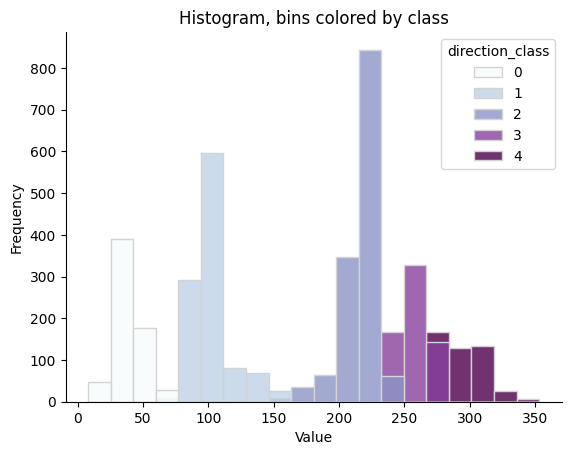

In [22]:
# Creating Histogram
sns.histplot(data=lines_gdf_cars, x='avg_heading', hue='direction_class', bins=20, alpha=0.8, palette='BuPu', edgecolor='lightgray')

# Removing graph border
sns.despine()

# Adding titlle and axis names
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram, bins colored by class')

# Showing graph
plt.show()

Creating Polar Plot


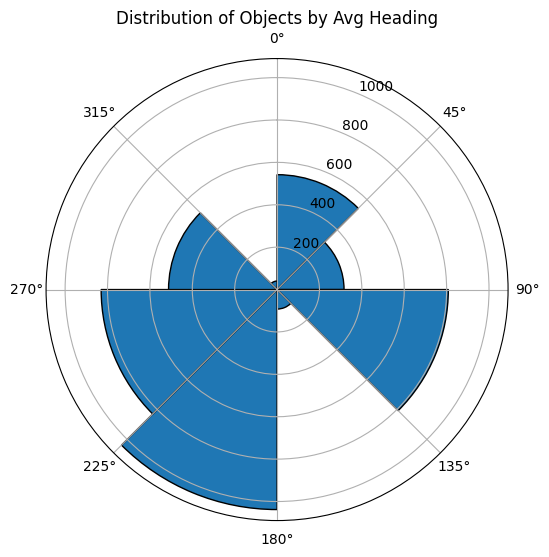

In [23]:
# Convert angles from degrees to radians for the polar plot
lines_gdf_cars['avg_heading_rad'] = np.deg2rad(lines_gdf_cars['avg_heading'])

# Create the polar plot
plt.figure(figsize=(10, 6))
ax = plt.subplot(111, projection='polar')

# Configure the polar plot: 0 degrees at the top and clockwise direction
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

# Define the number of bins
num_bins = 8
bins = np.linspace(0, 2 * np.pi, num_bins + 1)

# Count the number of objects in each bin
hist, edges = np.histogram(lines_gdf_cars['avg_heading_rad'], bins=bins)

# Plot the histogram on the polar plot
bars = ax.bar(edges[:-1], hist, width=np.diff(edges), align='edge', edgecolor='black')

# Set angle labels in degrees
ax.set_xticks(np.deg2rad(np.arange(0, 360, 45)))
ax.set_xticklabels(['0°', '45°', '90°', '135°', '180°', '225°', '270°', '315°'])

# Add title
plt.title('Distribution of Objects by Avg Heading')

# Display the plot
plt.show()

Based on the polar plot above, we can observe the main directions of car movements. However, it's important to note that only the 'average heading' for each object is considered. The heading may change throughout the route, and the average heading provides an approximate direction.

Nevertheless, this graph allows us to identify the main patterns of car movement.


#### Calculating amount of objects in different directions for pedestrians


Same process as for cars above


We are defining classes based on natural breaks. This method was selected because there are major directions that will be easily distinguishable using this approach.


In [24]:
pedestrians_heading_breaks = jenkspy.jenks_breaks(lines_gdf_pedestrians['avg_heading'], 5)

# Create a column for direction class based on the breaks
lines_gdf_pedestrians['direction_class'] = pd.cut(lines_gdf_pedestrians['avg_heading'], bins=pedestrians_heading_breaks, labels=False, include_lowest=True)

# Count the number of objects in each direction
direction_class_counts = lines_gdf_pedestrians['direction_class'].value_counts().sort_index()

print("Breaks:", pedestrians_heading_breaks)
print("Direction Class Counts:\n", direction_class_counts)

Breaks: [3.052, 89.59200000000001, 160.552, 228.439, 285.552, 358.052]
Direction Class Counts:
 0    388
1    371
2    411
3    358
4    241
Name: direction_class, dtype: int64


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Creating Histogram


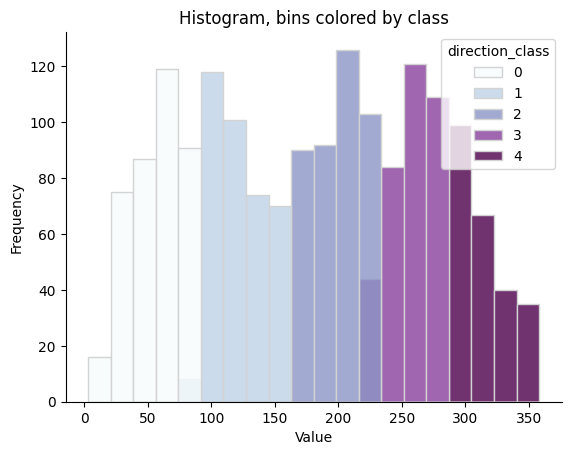

In [25]:
# Creating Histogram
sns.histplot(data=lines_gdf_pedestrians, x='avg_heading', hue='direction_class', bins=20, alpha=0.8, palette='BuPu', edgecolor='lightgray')

# Removing graph border
sns.despine()

# Adding titlle and axis names
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram, bins colored by class')

# Showing graph
plt.show()

Crearing Polar Plot


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


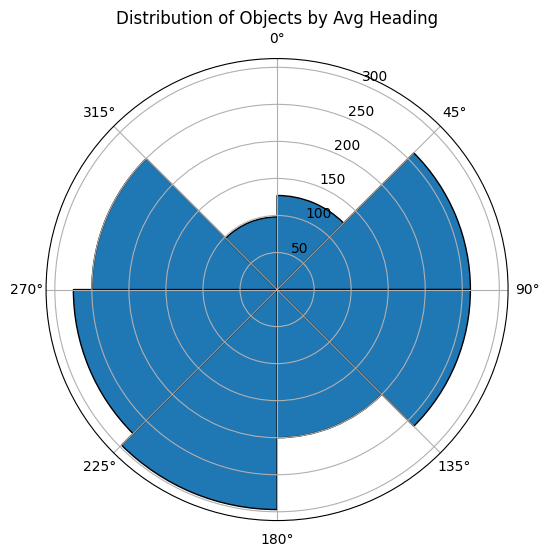

In [26]:
# Convert angles from degrees to radians for the polar plot
lines_gdf_pedestrians['avg_heading_rad'] = np.deg2rad(lines_gdf_pedestrians['avg_heading'])

# Create the polar plot
plt.figure(figsize=(10, 6))
ax = plt.subplot(111, projection='polar')

# Configure the polar plot: 0 degrees at the top and clockwise direction
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

# Define the number of bins
num_bins = 8
bins = np.linspace(0, 2 * np.pi, num_bins + 1)

# Count the number of objects in each bin
hist, edges = np.histogram(lines_gdf_pedestrians['avg_heading_rad'], bins=bins)

# Plot the histogram on the polar plot
bars = ax.bar(edges[:-1], hist, width=np.diff(edges), align='edge', edgecolor='black')

# Set angle labels in degrees
ax.set_xticks(np.deg2rad(np.arange(0, 360, 45)))
ax.set_xticklabels(['0°', '45°', '90°', '135°', '180°', '225°', '270°', '315°'])

# Add title
plt.title('Distribution of Objects by Avg Heading')

# Display the plot
plt.show()

For pedestrians this apporach is actually doesn not work good, beacuse the routes of pesestrians could be much more curved and chaotic. It is the reason why we get almost equal ditribution for each section in a Polar Plot.


#### Calculating amount of objects in different directions for two-wheelers


In [27]:
two_wheelers_heading_breaks = jenkspy.jenks_breaks(lines_gdf_two_wheelers['avg_heading'], 5)

# Create a column for direction class based on the breaks
lines_gdf_two_wheelers['direction_class'] = pd.cut(lines_gdf_two_wheelers['avg_heading'], bins=two_wheelers_heading_breaks, labels=False, include_lowest=True)

# Count the number of objects in each direction
direction_class_counts = lines_gdf_two_wheelers['direction_class'].value_counts().sort_index()

print("Breaks:", cars_heading_breaks)
print("Direction Class Counts:\n", direction_class_counts)

Breaks: [8.052, 70.552, 158.05200000000002, 236.827, 276.276, 353.052]
Direction Class Counts:
 0    43
1    66
2    59
3    45
4    37
Name: direction_class, dtype: int64


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Text(0.5, 1.0, 'Histogram, bins colored by class')

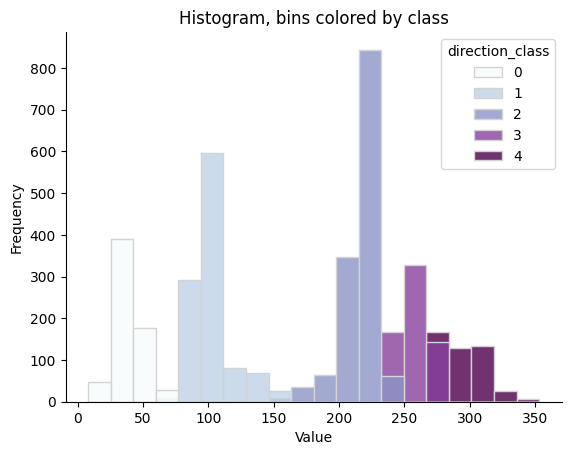

In [28]:
# Creating Histogram
sns.histplot(data=lines_gdf_cars, x='avg_heading', hue='direction_class', bins=20, alpha=0.8, palette='BuPu', edgecolor='lightgray')

# Removing graph border
sns.despine()

# Adding titlle and axis names
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram, bins colored by class')

# Showing graph

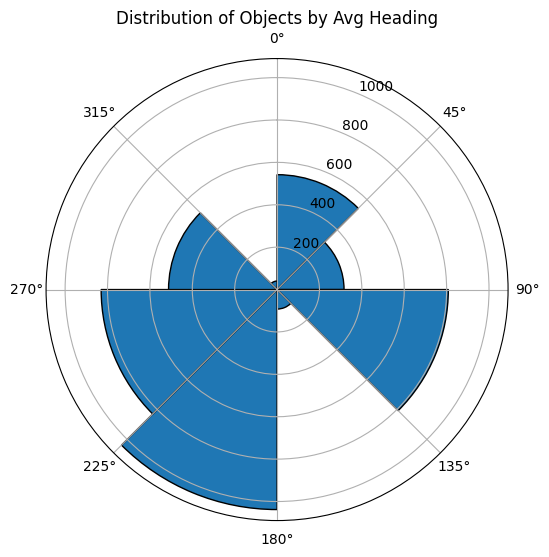

In [29]:
# Convert angles from degrees to radians for the polar plot
lines_gdf_cars['avg_heading_rad'] = np.deg2rad(lines_gdf_cars['avg_heading'])

# Create the polar plot
plt.figure(figsize=(10, 6))
ax = plt.subplot(111, projection='polar')

# Configure the polar plot: 0 degrees at the top and clockwise direction
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)

# Define the number of bins
num_bins = 8
bins = np.linspace(0, 2 * np.pi, num_bins + 1)

# Count the number of objects in each bin
hist, edges = np.histogram(lines_gdf_cars['avg_heading_rad'], bins=bins)

# Plot the histogram on the polar plot
bars = ax.bar(edges[:-1], hist, width=np.diff(edges), align='edge', edgecolor='black')

# Set angle labels in degrees
ax.set_xticks(np.deg2rad(np.arange(0, 360, 45)))
ax.set_xticklabels(['0°', '45°', '90°', '135°', '180°', '225°', '270°', '315°'])

# Add title
plt.title('Distribution of Objects by Avg Heading')

# Display the plot
plt.show()

For two-wheelers we can see the general pattern for objects movement. At the same time the issue here the same as we describeed it for cars: we are using only the average heading, which provides only an approximate direction


### Coclusion


In this section, we have proposed three different approaches to calculate the number of objects moving in various directions. Each method has its own advantages and limitations. Further analysis can be conducted to determine the most accurate approach or a combination of approaches.
